## Notebook Purpose

Analyze feature map regularization results for ismrm paper. Previously tuned parameters, i.e. see `20201121_results_fm_regularizn_quant_across_trials.ipynb`

### TODO
- Currently, fm_reg is run in the new pytorch environment, but fastmri results for ismrm were made in the old pytorch environment. hence need to port fm_reg over into old environment

In [30]:
import os, sys
from os import listdir
from os.path import isfile, join
import numpy as np
import pandas as pd
import json
import torch
from matplotlib import pyplot as plt

sys.path.append('/home/vanveen/ConvDecoder/')
from utils.data_io import load_h5
from utils.evaluate import calc_metrics, norm_imgs
from utils.transform import fft_2d, ifft_2d, root_sum_squares, \
                            crop_center

In [42]:
display_rows = 10#len(df)
pd.set_option('display.max_rows', display_rows)

def agg_sort_df(df_in):
    ''' given df, aggregate trial_ids across means for different file_ids
        sort df rows by the highest ssim_dc '''
    try:
        agg_fns = {'ssim_dc': 'mean', 'psnr_dc': 'mean', 'ssim_est':'mean', 'psnr_est':'mean', \
           'alpha_fm': 'first', 'num_iter': 'first', 'iter_start_fm_loss': 'first', \
           'weight_method': 'first', 'downsamp_method':'first'}
        df = df_in.groupby(df_in['trial_id']).aggregate(agg_fns).reset_index()
    except:
        agg_fns = {'ssim_dc': 'mean', 'psnr_dc': 'mean', 'ssim_est':'mean', 'psnr_est':'mean', \
           'alpha_fm': 'first', 'num_iter': 'first', \
           'weight_method': 'first', 'downsamp_method':'first'}
        df = df_in.groupby(df_in['trial_id']).aggregate(agg_fns).reset_index()
    df = df.sort_values(by='ssim_dc', ascending=False)
    
    return df

def load_gt(file_id):
    _, ksp_orig = load_h5(file_id)
    ksp_orig = torch.from_numpy(ksp_orig)
    return crop_center(root_sum_squares(ifft_2d(ksp_orig)), 320, 320)

def plot_list(arr_list, clim=(0, .1)):
    
    NUM_COLS = len(arr_list)
    title_list = ['gt', 'dd+']
    
    fig = plt.figure(figsize=(20,20))
    
    for idx in range(NUM_COLS):
        ax = fig.add_subplot(1,NUM_COLS,idx+1)
        ax.imshow(arr_list[idx], cmap='gray', clim=clim)
        ax.set_title(title_list[idx], fontsize=20)
        ax.axis('off')

def compute_scores(path, trial_id=None):
    NUM_METRICS = 4
    NUM_SAMPS = len(file_id_list)
    NUM_VARS = 2 # gt, dc
    metric_list = np.empty((NUM_SAMPS, NUM_METRICS))
    im_list = np.empty((NUM_SAMPS, NUM_VARS, 320, 320))
    
    for idx, file_id in enumerate(file_id_list):
        
        if trial_id:
            fn_base = '{}{}_{}'.format(path, trial_id, file_id)
        else:
            fn_base = '{}{}'.format(path, file_id)
        
        img_gt = np.array(load_gt(file_id)).astype('float32')
        img_dc = np.load('{}_dc.npy'.format(fn_base)).astype('float32')
        
        img_gt, img_dc = norm_imgs(img_gt, img_dc)
        
        metric_list[idx] = calc_metrics(img_gt, img_dc)
        print(idx, metric_list[idx][2])
        im_list[idx] = [img_gt, img_dc]
        
    return np.mean(metric_list, axis=0), im_list

In [19]:
path_fm = '/bmrNAS/people/dvv/out_fastmri/expmt_fm_loss/'
path_tb = path_fm + 'trials_best/'
path_6 = '/bmrNAS/people/dvv/out_fastmri/ismrm/model6/'

# n = 5 or n = 11 prototyping test set
file_id_list = ['1000273', '1000325', '1000464', \
                '1000537', '1000818', '1001140', '1001219', \
                '1001338', '1001598', '1001533', '1001798']
# file_id_list = ['1000273', '1000325', '1000464', '1000537', '1000818']

### compare results across methods

trial description
- environment: pt==1.7 is new, pt==1.5 is old
- returns: loss_ksp (old bug?) or loss_total
- thus (environment, returns)

trials
- 0000_10k: (new, ---) w alpha_fm=0
- autybby9: (new, loss_ksp) w alpha_fm non-zero
- dkrrw7xv: (new, loss_total)
- path_6: (old, ---) w alpha_fm=0

# TODO
- currently have story of 1-2% quant improvement and an image below we can demo
- on most images this results in imperceptible differences, but on some (e.g. 1000325) we have a better ability to reconstruct sharp details
    - we are further studying this method
    
- fastmri figure:
    - two rows, 4x and 8x
    - each column is different sample
    - ssim, psnr value overlaid on image

In [16]:
print(compute_scores(path_fm, 'dkrrw7xv'))

array([ 0.63220429,  0.94864886,  0.76061915, 31.97405722])

In [21]:
for trial_id in ['0000_10k', 'autybby9']:
    print(compute_scores(path_tb, trial_id))

[ 0.62201906  0.94783815  0.75140817 31.86894469]
[ 0.63941337  0.94933479  0.76198839 32.0448043 ]


In [25]:
compute_scores(path_6)

array([ 0.65099647,  0.94691538,  0.76467067, 31.92233126])

### qual results

In [43]:
metric_list_bl, im_list_bl = compute_scores(path_tb, '0000_10k')
metric_list_fm, im_list_fm = compute_scores(path_tb, 'autybby9')

0 0.7516407374332086
1 0.6995268734828916
2 0.8239610133082929
3 0.8064743843875712
4 0.786120430111017
5 0.764286191187491
6 0.8614506020937927
7 0.7195034151426837
8 0.7806573135380285
9 0.6269603950226957
10 0.6449085255356082
0 0.7563067687009505
1 0.7696805817892826
2 0.8317159180214456
3 0.8089801519234887
4 0.7788084535216662
5 0.7699856511202764
6 0.859425197755515
7 0.7158095005169914
8 0.7838269265286049
9 0.6429037508788605
10 0.6644294963228217


In [39]:
print(metric_list_bl)
print(metric_list_fm)

[ 0.62201909  0.94783812  0.75140817 31.86894458]
[ 0.63941339  0.94933482  0.7619884  32.04480433]


<ipython-input-35-17ddc1b08fd1>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(20,20))


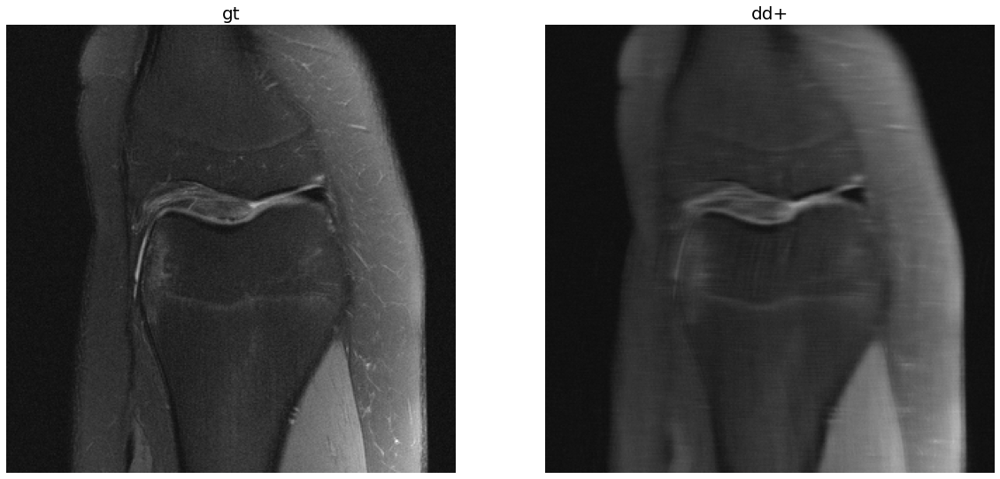

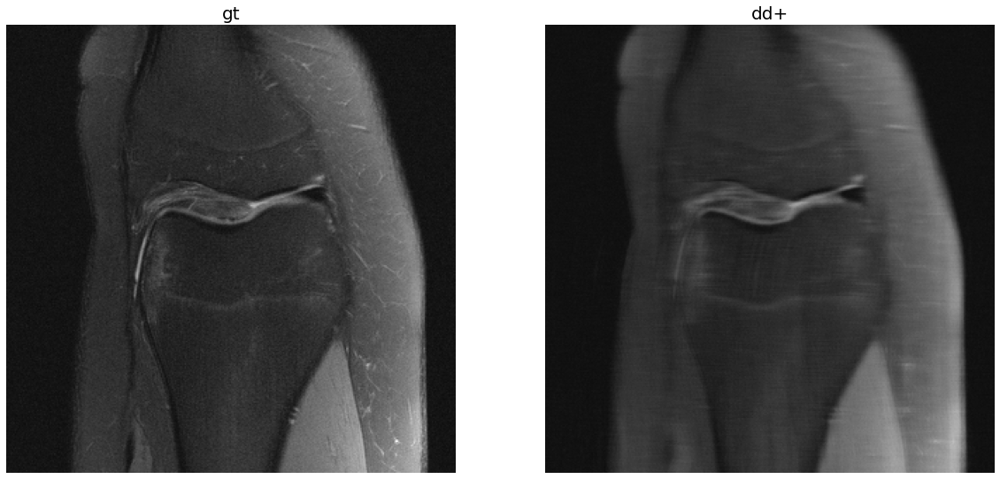

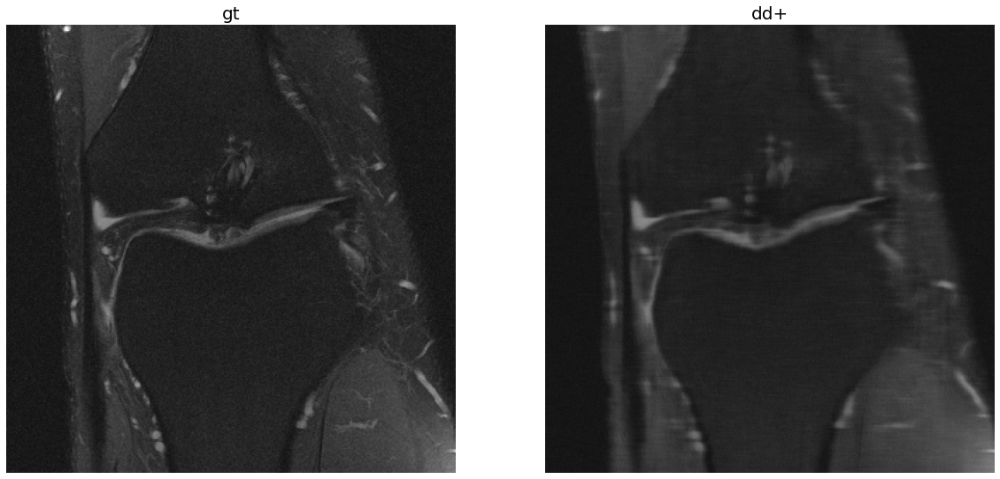

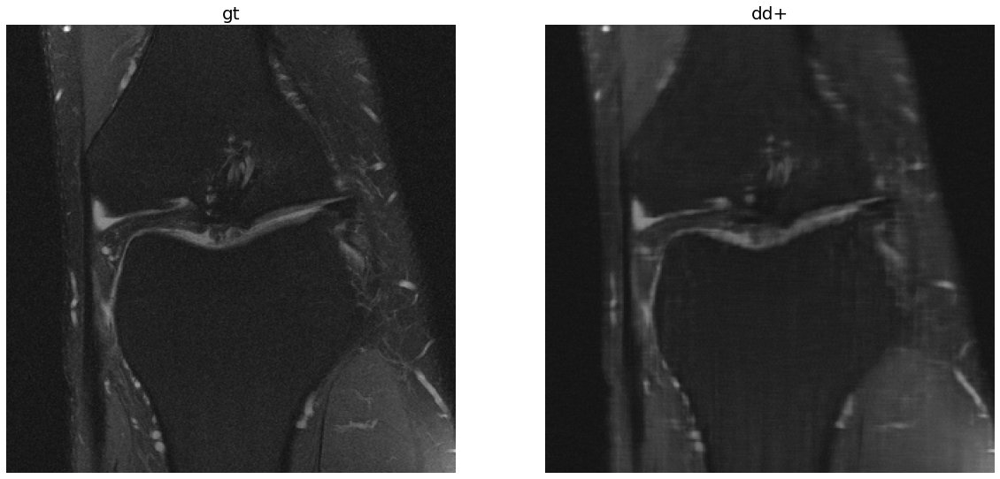

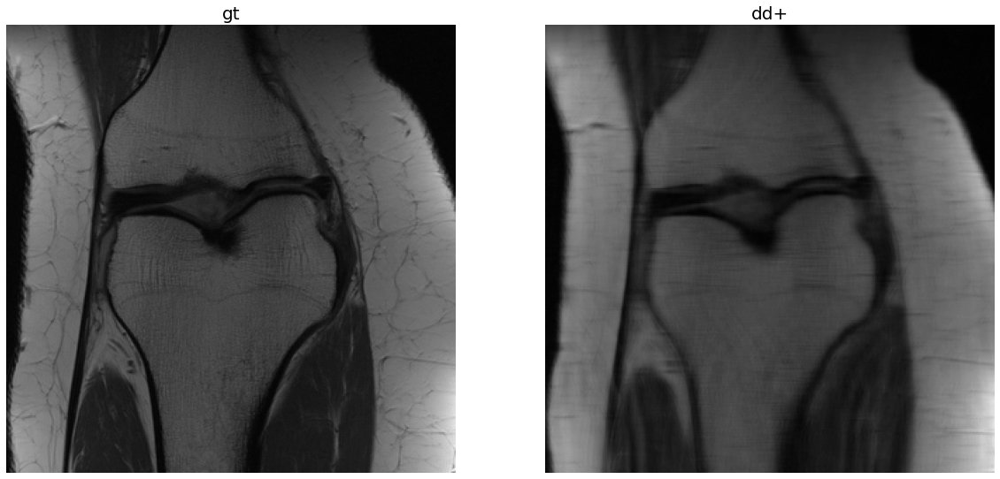

...

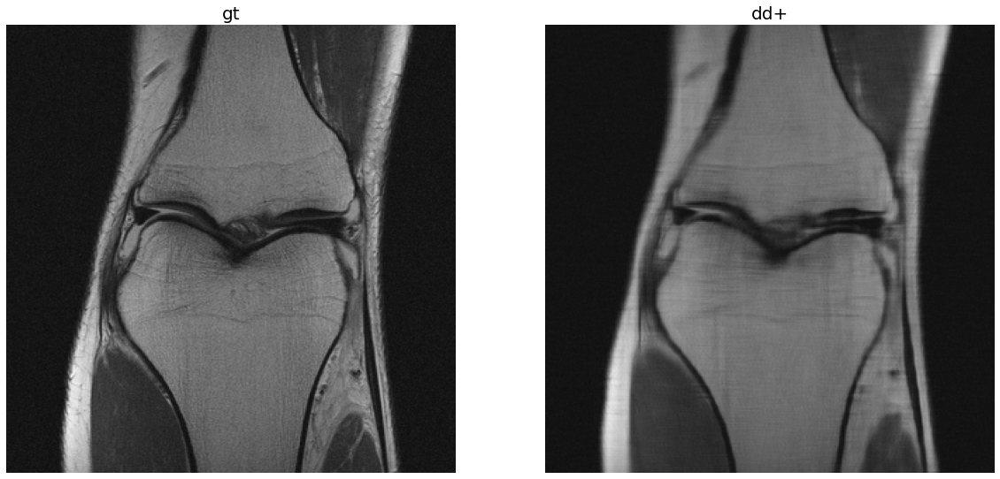

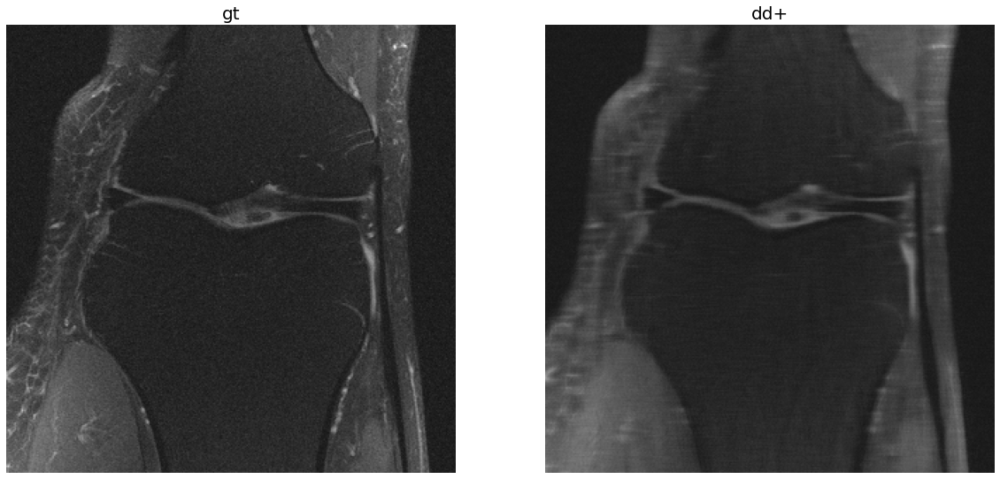

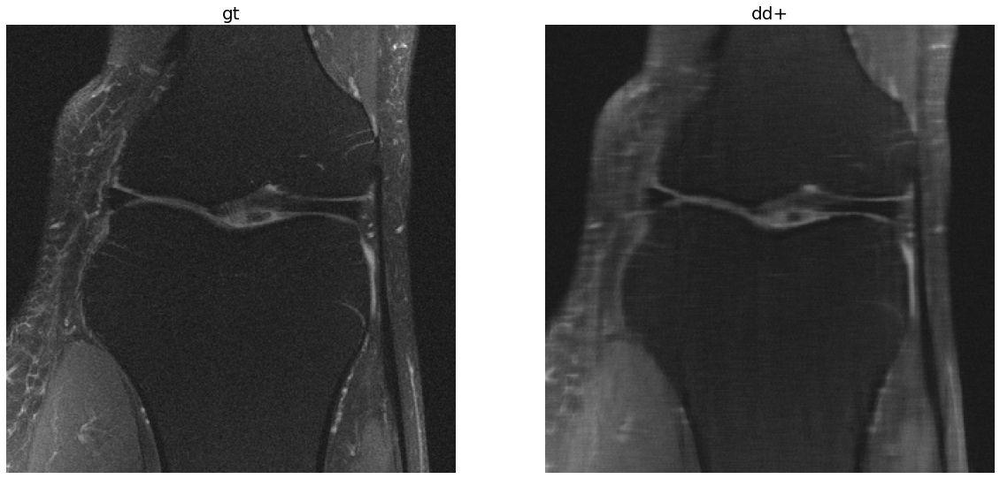

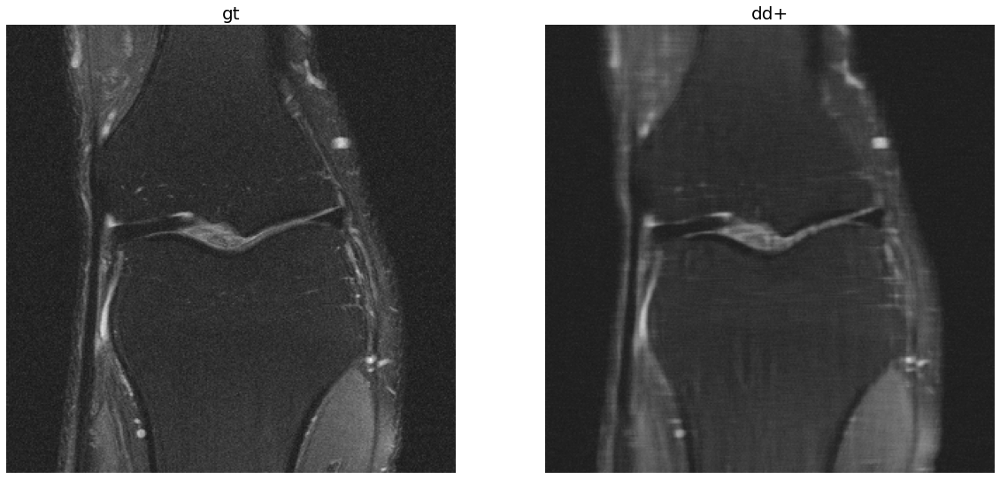

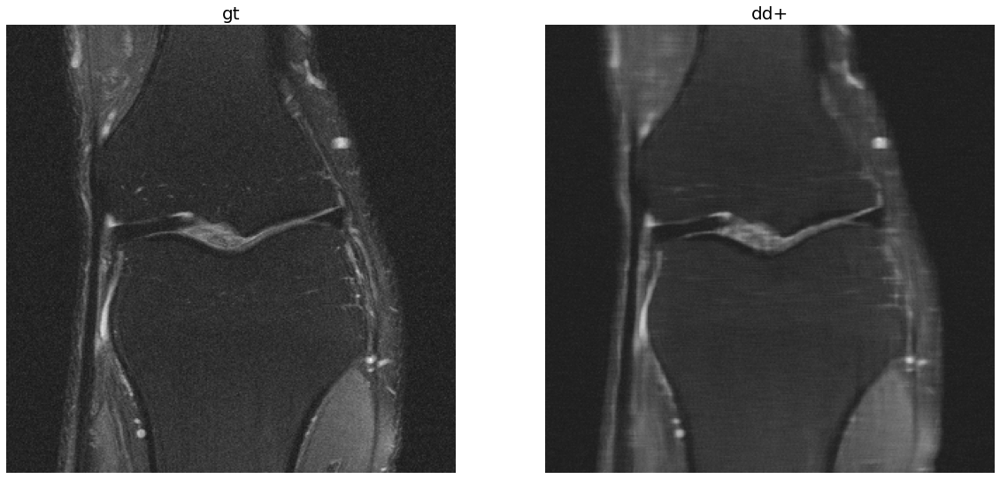

In [37]:
for idx in range(len(im_list_bl)):
    plot_list(im_list_bl[idx])
    plot_list(im_list_fm[idx])

# OLD

In [18]:
path_results = '/home/vanveen/ConvDecoder/expmt/results/'
df_ = pd.read_csv(path_results + 'run_20201210-073745.csv')

# save_df_to_json(path_results + 'trials_best_20201121-160718.json', df_10k)

df_ = agg_sort_df(df_)
df_

,trial_id,ssim_dc,psnr_dc,ssim_est,psnr_est,alpha_fm,num_iter,weight_method,downsamp_method
0,dkrrw7xv,0.7841,30.403673,0.633055,27.478227,0.0001,10000,all,bilinear
